In [1]:

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()
from ultralytics import YOLO

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/78.2 GB disk)


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/yolov8

/content/drive/MyDrive/yolov8


In [7]:
!ls

data.yaml  yolo_dataset


In [6]:
import os
import glob

# Define the directories
data_dir = '/content/drive/MyDrive/yolov8/yolo_dataset'
train_labels_dir = os.path.join(data_dir, 'train', 'labels')
valid_labels_dir = os.path.join(data_dir, 'valid', 'labels')
test_labels_dir = os.path.join(data_dir, 'test', 'labels')  # Optional

# Function to determine the number of classes from label files
def get_num_classes(labels_dir):
    classes = set()
    label_files = glob.glob(os.path.join(labels_dir, '*.txt'))
    for label_file in label_files:
        with open(label_file, 'r') as f:
            for line in f:
                class_id = int(line.split()[0])
                classes.add(class_id)
    return len(classes), classes

# Get the number of classes from the train, valid, and test labels
num_classes_train, classes_train = get_num_classes(train_labels_dir)
num_classes_valid, classes_valid = get_num_classes(valid_labels_dir)
num_classes_test, classes_test = get_num_classes(test_labels_dir)  # Optional

# Verify that the number of classes is consistent across all sets
all_classes = classes_train.union(classes_valid).union(classes_test)
num_classes = len(all_classes)

# Create the data.yaml content
data_yaml = f"""
train: {os.path.join(data_dir, 'train', 'images')}
val: {os.path.join(data_dir, 'valid', 'images')}
test: {os.path.join(data_dir, 'test', 'images')}

nc: {num_classes}
names: {[f'class{i}' for i in range(num_classes)]}
"""

# Save data.yaml in the data directory
with open(os.path.join( '/content/drive/MyDrive/yolov8', 'data.yaml'), 'w') as f:
    f.write(data_yaml)

print(f"data.yaml created and saved in {data_dir}")

data.yaml created and saved in /content/drive/MyDrive/yolov8/yolo_dataset


In [8]:
!yolo task=detect mode=train model=yolov8s.pt data= data.yaml epochs=25 imgsz=640 plots=True

100% 21.5M/21.5M [00:00<00:00, 179MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=data.yaml, epochs=25, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=F

args.yaml					    results.png		   val_batch0_pred.jpg
confusion_matrix.png				    train_batch0.jpg	   val_batch1_labels.jpg
events.out.tfevents.1720704278.f9eea7344cf1.8634.0  train_batch1425.jpg    val_batch1_pred.jpg
F1_curve.png					    train_batch1426.jpg    val_batch2_labels.jpg
P_curve.png					    train_batch1427.jpg    val_batch2_pred.jpg
PR_curve.png					    train_batch1.jpg	   weights
R_curve.png					    train_batch2.jpg
results.csv					    val_batch0_labels.jpg


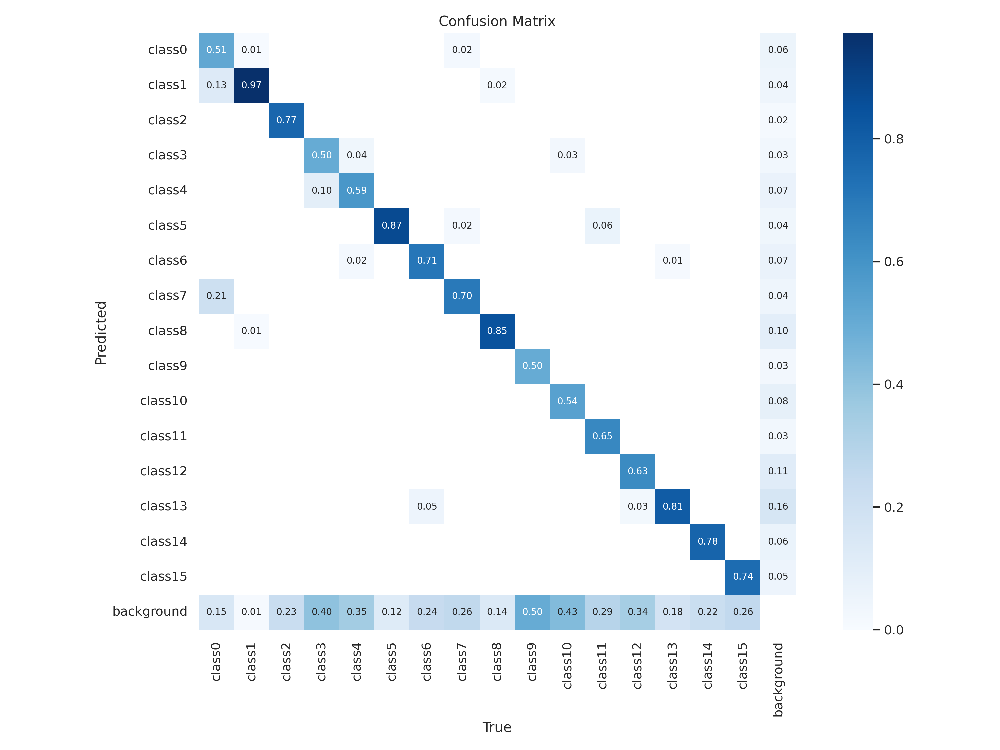

In [11]:
!ls runs/detect/train/
from IPython.display import display, Image

Image(filename='runs/detect/train/confusion_matrix.png', width=600)

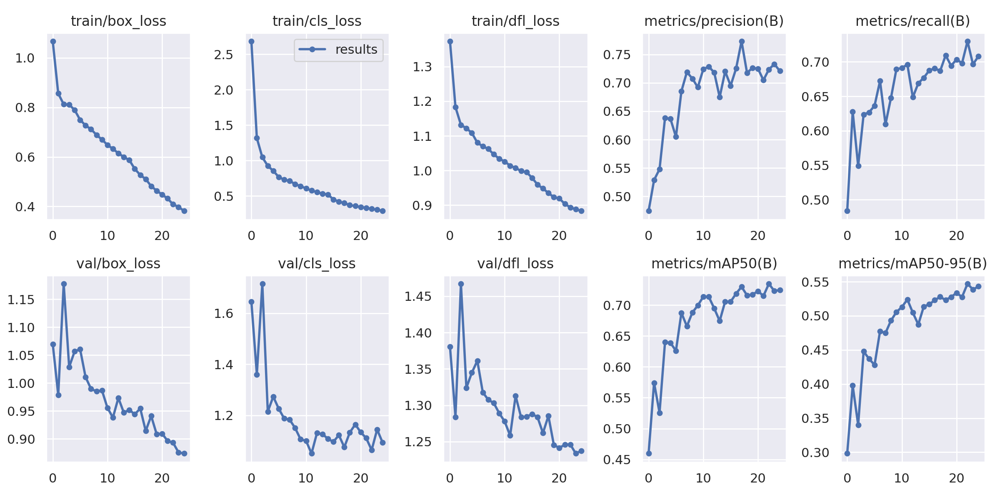

In [12]:
Image(filename='runs/detect/train/results.png', width=600)

In [16]:
!yolo task=detect mode=val model=runs/detect/train/weights/best.pt data=data.yaml

2024-07-11 14:17:38.595003: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-11 14:17:38.595060: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-11 14:17:38.596723: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-11 14:17:38.604476: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-11 14:17:39.943212: W tensorflow/comp

In [25]:
!yolo task=detect mode=predict model=runs/detect/train/weights/best.pt conf=0.25 source=yolo_dataset/test/images save_txt=True save='/content/drive/MyDrive/yolov8/runs/detect/predictions'

2024-07-11 14:52:56.627577: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-11 14:52:56.627630: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-11 14:52:56.628980: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-11 14:52:57.813295: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11131776 parameters, 0 gradients, 28.5 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/22 /content/drive/MyDri

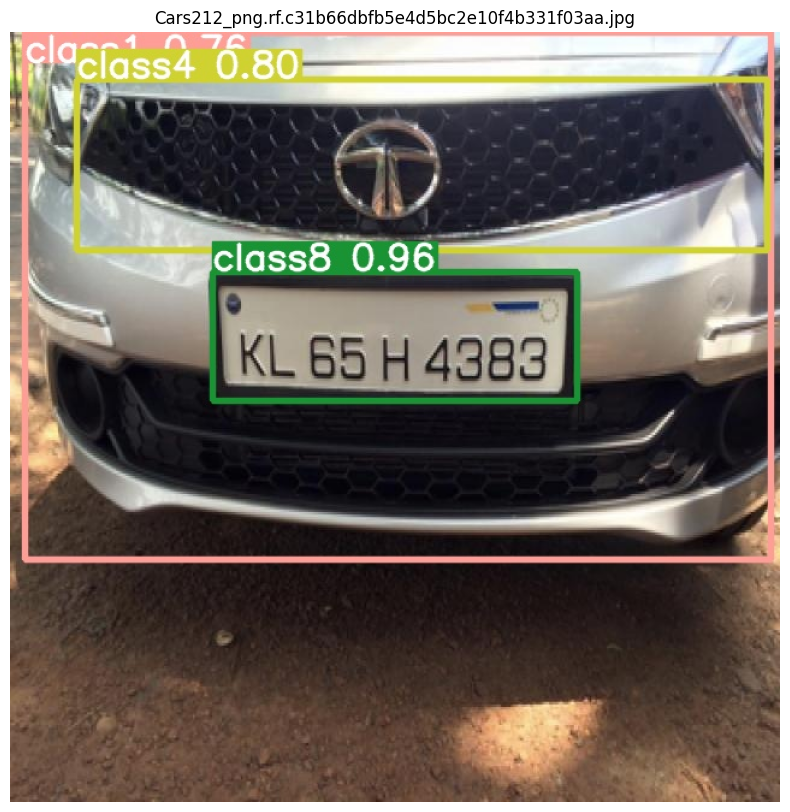

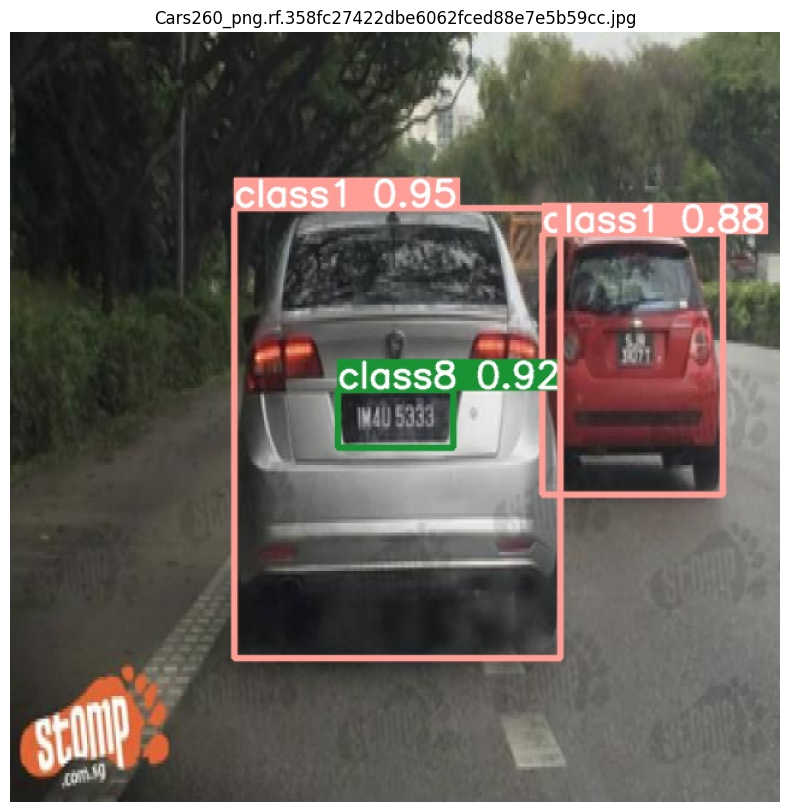

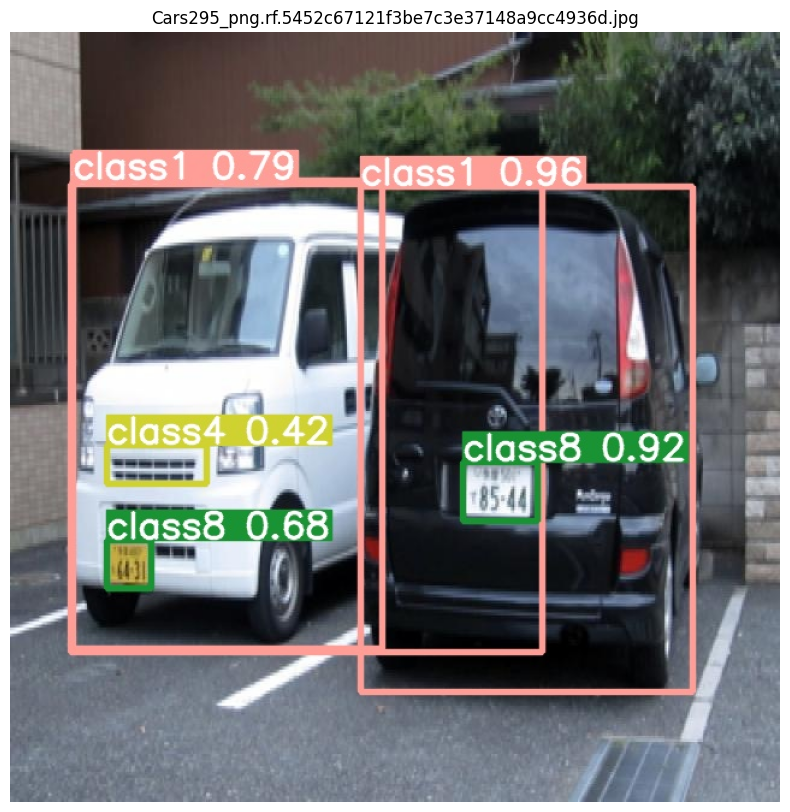

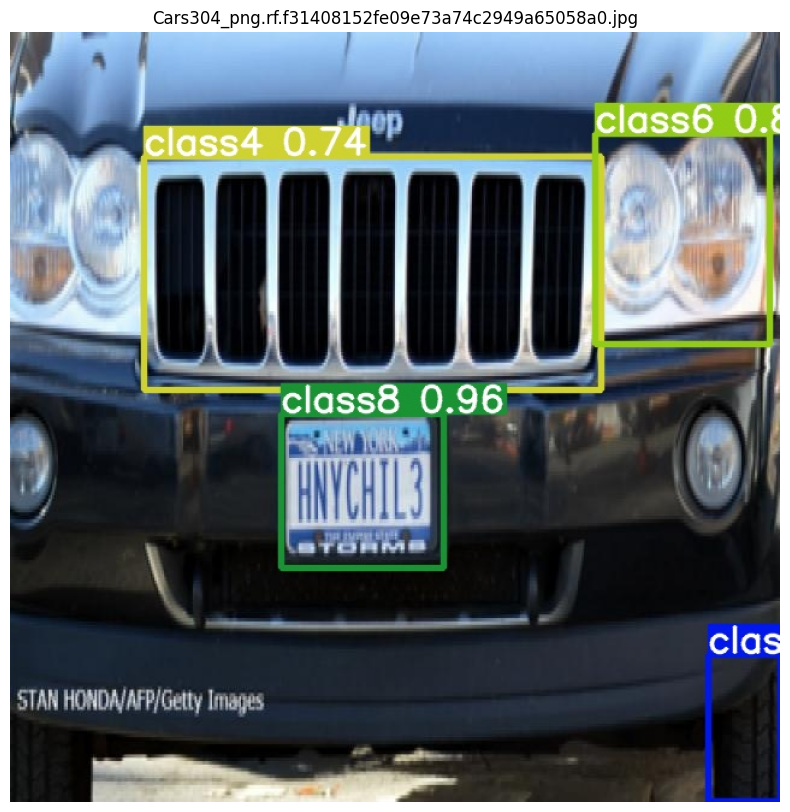

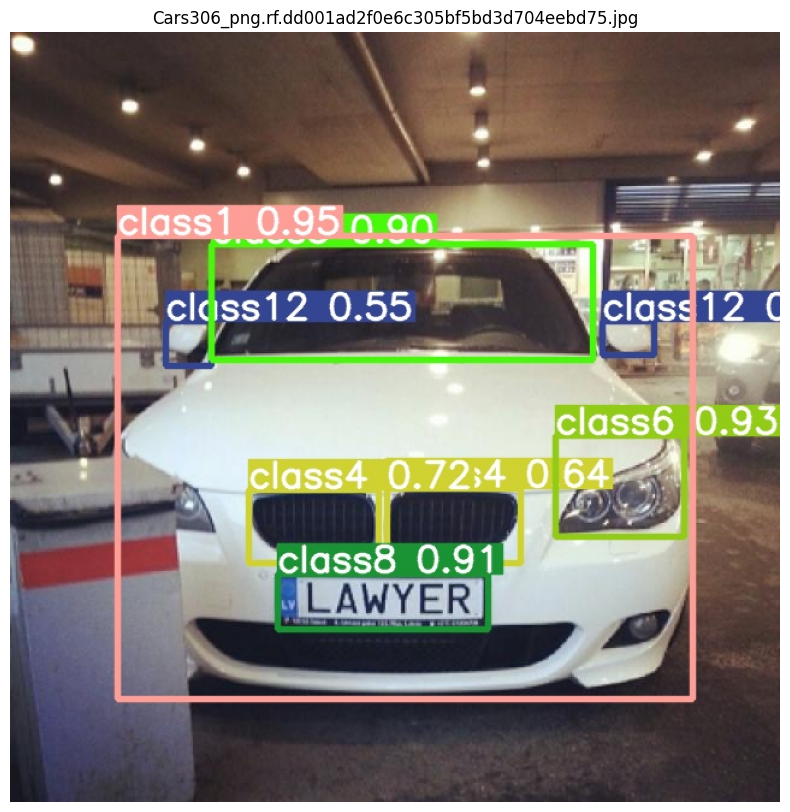

...

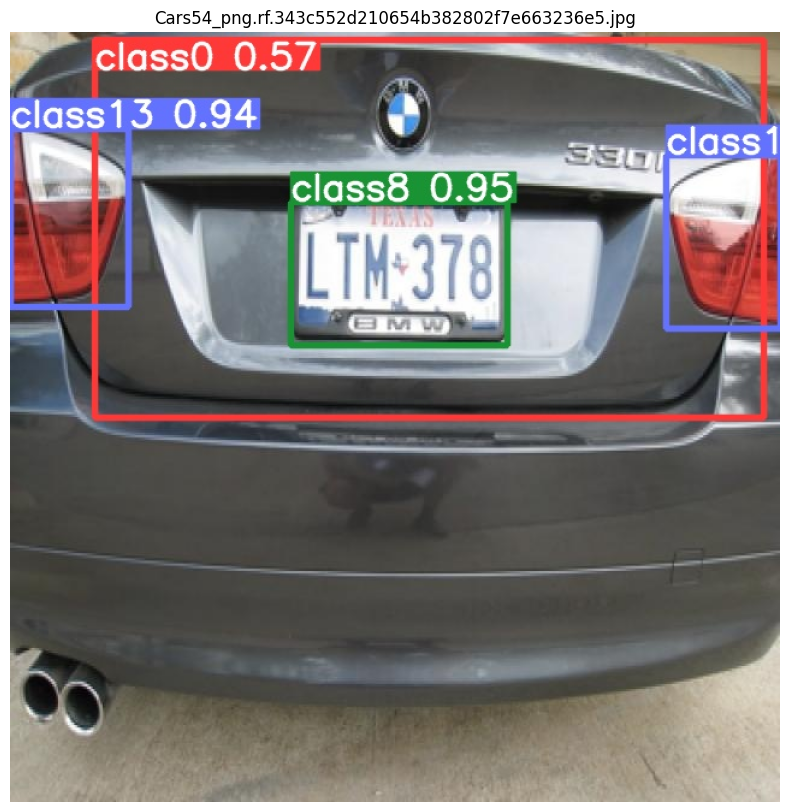

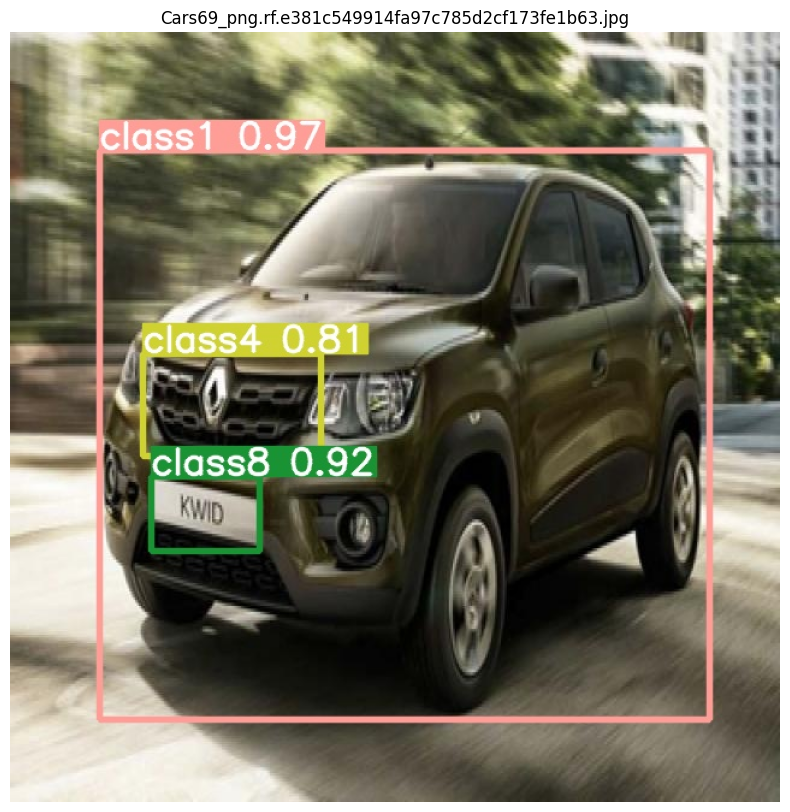

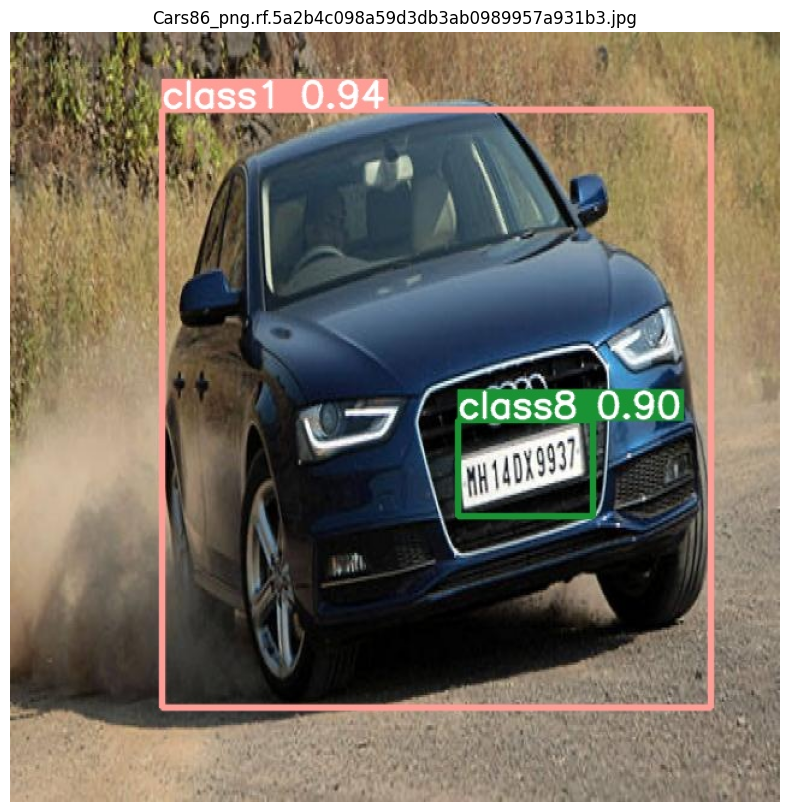

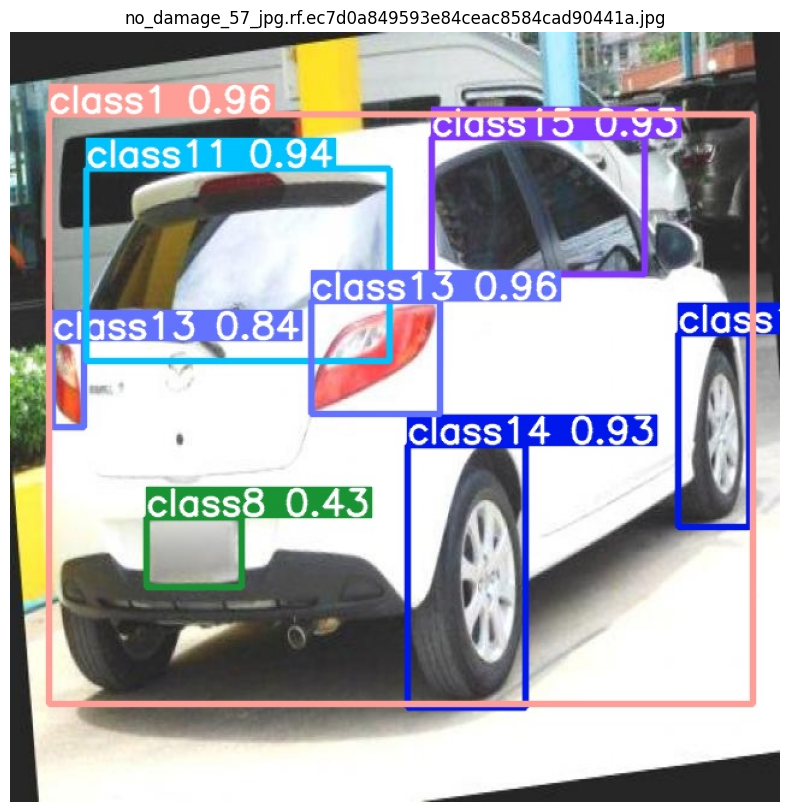

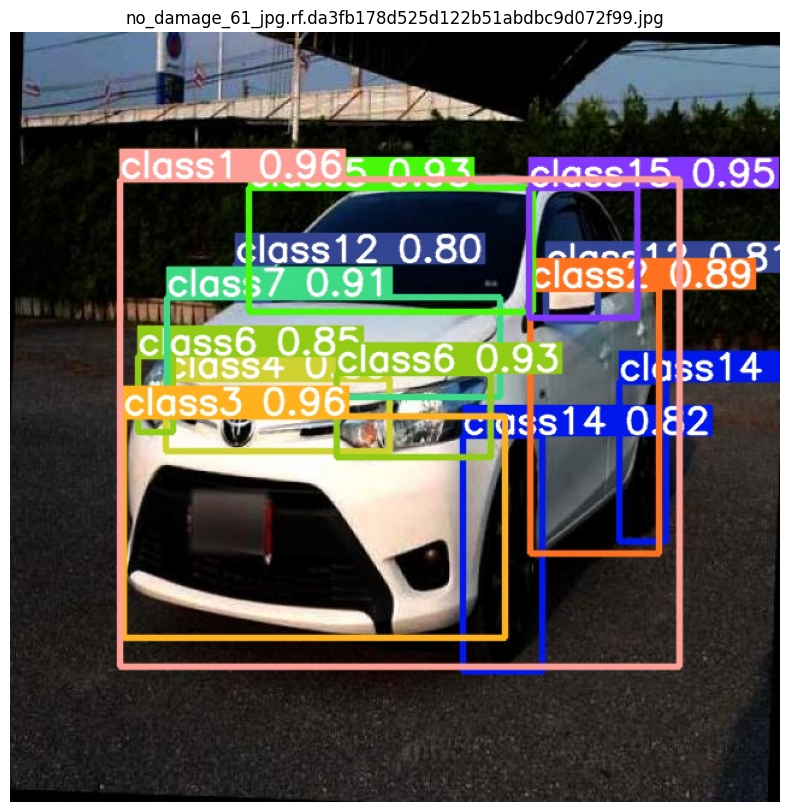

In [27]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Directory where the predicted images with bounding boxes are saved
predictions_images_dir = '/content/drive/MyDrive/yolov8/runs/detect/predict'  # Update with your actual path

# Function to display images with bounding boxes
def display_predictions(predictions_images_dir):
    # List all the images in the predictions directory
    image_files = [f for f in os.listdir(predictions_images_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

    # Display each image
    for image_file in image_files:
        image_path = os.path.join(predictions_images_dir, image_file)
        image = Image.open(image_path)

        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.title(image_file)
        plt.axis('off')
        plt.show()

# Display the predicted images with bounding boxes
display_predictions(predictions_images_dir)

